<p style="align: center;"><img align=center src="https://drive.google.com/uc?export=view&id=1I8kDikouqpH4hf7JBiSYAeNT2IO52T-T" width=600 height=480/></p>
<h3 style="text-align: center;"><b>Школа глубокого обучения ФПМИ МФТИ</b></h3>

<h3 style="text-align: center;"><b>Домашнее задание. Generative adversarial networks</b></h3>



В этом домашнем задании вы обучите GAN генерировать лица людей и посмотрите на то, как можно оценивать качество генерации

In [1]:
import pandas as pd
import os
from pathlib import Path
from PIL import Image
from torch.utils.data import DataLoader, Dataset
from torchvision.datasets import ImageFolder
import torchvision.transforms as tt
import torch
import torch.nn as nn
from torchsummary import summary
import cv2
import random
from tqdm.notebook import tqdm
from torchvision.utils import save_image
from torchvision.utils import make_grid
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
%matplotlib inline

from IPython.display import clear_output

from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import LeaveOneOut
from sklearn.metrics import accuracy_score
from sklearn.manifold import TSNE

sns.set(style='darkgrid', font_scale=1.2)

In [2]:
train_on_gpu = torch.cuda.is_available()

if not train_on_gpu:
    print('CUDA is not available.  Training on CPU ...')
else:
    print('CUDA is available!  Training on GPU ...')

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

print(device)

!nvidia-smi

CUDA is available!  Training on GPU ...
cuda
Tue Jan  3 00:18:38 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   62C    P0    28W /  70W |      3MiB / 15109MiB |      4%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                           

In [3]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


Загрузим наши фотогрфии. Они уже размера 128 на 128!!!

In [4]:
!unzip -q /content/drive/MyDrive/GAN/thumbnails128x128.zip -d train_foto 

In [5]:
SEED = 1123
RANDOM_STATE = SEED
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)
torch.backends.cudnn.deterministic = True

# Вариант I

## Часть 1. Подготовка данных (1 балл)

В качестве обучающей выборки возьмем часть датасета [Flickr Faces](https://github.com/NVlabs/ffhq-dataset), который содержит изображения лиц людей в высоком разрешении (1024х1024). Оригинальный датасет очень большой, поэтому мы возьмем его часть. Скачать датасет можно [здесь](https://drive.google.com/file/d/1KWPc4Pa7u2TWekUvNu9rTSO0U2eOlZA9/view?usp=sharing)

Давайте загрузим наши изображения. Напишите функцию, которая строит DataLoader для изображений, при этом меняя их размер до нужного значения (размер 1024 слишком большой, поэтому мы рекомендуем взять размер 128 либо немного больше)

In [34]:
DATA_DIR =  Path('/content/train_foto/thumbnails128x128')


In [35]:
image_files = sorted(list(DATA_DIR.rglob('*.png')))
print(f'Датасет содержит {len(image_files)} изображения')

Датасет содержит 65534 изображения


Возьмем 4.000 изображений, для ускорения нашего обучения.

In [36]:
image_files = image_files[:4000]

In [37]:
# тк наши фотографии уже 128х128, то менять размер не нужно

class DatasetLoader(Dataset):
    """
    Датасет с картинками, который паралельно подгружает их из папок
    производит скалирование и превращение в торчевые тензоры
    """
    def __init__(self, files):
        super().__init__()
        # список файлов для загрузки
        self.files = sorted(files)
        
        self.len_ = len(self.files)
                           
    def __len__(self):
        return self.len_
      
    def load_sample(self, file):
        image = Image.open(file)
        image.load()
        return image

    def __getitem__(self, index):
        # для преобразования изображений в тензоры PyTorch и нормализации входа
        
        transform = tt.Compose([
                                tt.Lambda(lambda x: np.array(x, dtype="float32") / 255),
                                tt.ToTensor(),
                                tt.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
                                ]) 
        
        
        x = self.load_sample(self.files[index])
        x = transform(x)
        return x  

In [38]:
# создадим датасет из торч-тензоров
dataset = DatasetLoader(image_files) 

for i in dataset:
  print(i.shape)
  break

torch.Size([3, 128, 128])


In [39]:
data_loader = DataLoader(dataset, batch_size=64, shuffle=True, num_workers=2, pin_memory=True)    
len(data_loader)

63

In [40]:
for i in data_loader:
  print(i.shape)
  break

torch.Size([64, 3, 128, 128])


In [41]:
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl: 
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [42]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
device

device(type='cuda')

In [43]:
data_loader_device = DeviceDataLoader(data_loader, device)

In [44]:
for i in data_loader_device:
  print(i.shape)
  break

torch.Size([64, 3, 128, 128])


In [45]:
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

In [46]:
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images in dl:
        show_images(images, nmax)
        break

Посмотрим, как выглядит батч

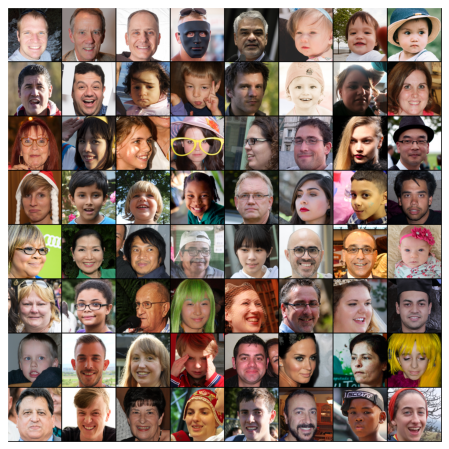

In [47]:
show_batch(data_loader)

## Часть 2. Построение и обучение модели (2 балла)

Сконструируйте генератор и дискриминатор. Помните, что:
* дискриминатор принимает на вход изображение (тензор размера `3 x image_size x image_size`) и выдает вероятность того, что изображение настоящее (тензор размера 1)

* генератор принимает на вход тензор шумов размера `latent_size x 1 x 1` и генерирует изображение размера `3 x image_size x image_size`

In [48]:
class Discriminator(nn.Module):
  def __init__(self):
    super(Discriminator, self).__init__() 

    self.main = nn.Sequential(
      
      nn.Conv2d(3, 128,  kernel_size=4, stride=2, padding=1, bias=False),
      nn.LeakyReLU(0.2, inplace=True),
            
      nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
      nn.BatchNorm2d(256),
      nn.LeakyReLU(0.2, inplace=True),
      
      nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
      nn.BatchNorm2d(512),
      nn.LeakyReLU(0.2, inplace=True),
      
      nn.Conv2d(512, 1024, kernel_size=4, stride=2, padding=1, bias=False),
      nn.BatchNorm2d(1024),
      nn.LeakyReLU(0.2, inplace=True),
      
      nn.Conv2d(1024, 2056, kernel_size=4, stride=2, padding=1, bias=False),
      nn.BatchNorm2d(2056),
      nn.LeakyReLU(0.2, inplace=True),
            
      nn.Conv2d(2056, 1, kernel_size=4, stride=1, padding=0, bias=False),
      
      nn.Flatten(),
      nn.Sigmoid())

  def forward(self, input):
      return self.main(input)

In [49]:
discriminator = to_device(Discriminator(), device)

In [50]:
summary(discriminator, (3, 128, 128))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [-1, 128, 64, 64]           6,144
       BatchNorm2d-2          [-1, 128, 64, 64]             256
         LeakyReLU-3          [-1, 128, 64, 64]               0
            Conv2d-4          [-1, 256, 32, 32]         524,288
       BatchNorm2d-5          [-1, 256, 32, 32]             512
         LeakyReLU-6          [-1, 256, 32, 32]               0
            Conv2d-7          [-1, 512, 16, 16]       2,097,152
       BatchNorm2d-8          [-1, 512, 16, 16]           1,024
         LeakyReLU-9          [-1, 512, 16, 16]               0
           Conv2d-10           [-1, 1024, 8, 8]       8,388,608
      BatchNorm2d-11           [-1, 1024, 8, 8]           2,048
        LeakyReLU-12           [-1, 1024, 8, 8]               0
           Conv2d-13           [-1, 2056, 4, 4]      33,685,504
      BatchNorm2d-14           [-1, 205

In [51]:
latent_size = 128

In [52]:
class Generator(nn.Module):
  def __init__(self):
    super(Generator, self).__init__()

    self.main = nn.Sequential(
      # in: latent_size x 1 x 1

      nn.ConvTranspose2d(latent_size, 1024, kernel_size=4, stride=1, padding=0, bias=False),
      nn.BatchNorm2d(1024),
      nn.ReLU(True),
      
      nn.ConvTranspose2d(1024, 512, kernel_size=4, stride=2, padding=1, bias=False),
      nn.BatchNorm2d(512),
      nn.ReLU(True),
     
      nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
      nn.BatchNorm2d(256),
      nn.ReLU(True),
      
      nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
      nn.BatchNorm2d(128),
      nn.ReLU(True),
      
      nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
      nn.BatchNorm2d(64),
      nn.ReLU(True),
      
      nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
      nn.Tanh()
      )
  def forward(self, input):
    return self.main(input)

In [53]:
generator = to_device(Generator(), device)

In [54]:
summary(generator, (128, 1, 1) )

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
   ConvTranspose2d-1           [-1, 1024, 4, 4]       2,097,152
       BatchNorm2d-2           [-1, 1024, 4, 4]           2,048
              ReLU-3           [-1, 1024, 4, 4]               0
   ConvTranspose2d-4            [-1, 512, 8, 8]       8,388,608
       BatchNorm2d-5            [-1, 512, 8, 8]           1,024
              ReLU-6            [-1, 512, 8, 8]               0
   ConvTranspose2d-7          [-1, 256, 16, 16]       2,097,152
       BatchNorm2d-8          [-1, 256, 16, 16]             512
              ReLU-9          [-1, 256, 16, 16]               0
  ConvTranspose2d-10          [-1, 128, 32, 32]         524,288
      BatchNorm2d-11          [-1, 128, 32, 32]             256
             ReLU-12          [-1, 128, 32, 32]               0
  ConvTranspose2d-13           [-1, 64, 64, 64]         131,072
      BatchNorm2d-14           [-1, 64,

Посмотрим, как выглядит шум, из которого будут генерироваться изображения

torch.Size([64, 3, 128, 128])


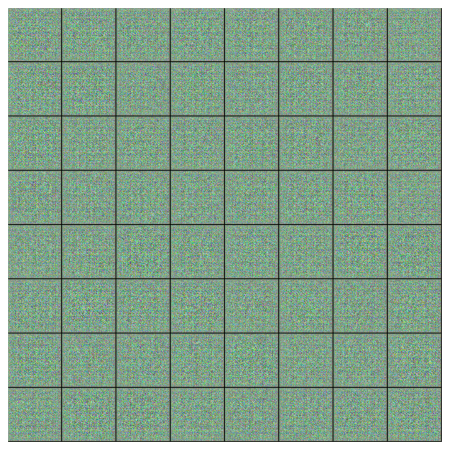

In [55]:
xb = torch.randn(64, latent_size, 1, 1) 
fake_images = generator(xb.to(device))
print(fake_images.shape)
show_images(fake_images.cpu())

Перейдем теперь к обучению нашего GANа. Алгоритм обучения следующий:
1. Учим дискриминатор:
  * берем реальные изображения и присваиваем им метку 1
  * генерируем изображения генератором и присваиваем им метку 0
  * обучаем классификатор на два класса

2. Учим генератор:
  * генерируем изображения генератором и присваиваем им метку 0
  * предсказываем дискриминаторором, реальное это изображение или нет


В качестве функции потерь берем бинарную кросс-энтропию

In [56]:
lr = 0.0001
epochs = 350
batch_size = 64

model = {
    "discriminator": discriminator,
    "generator": generator
}

criterion = {
    "discriminator": nn.BCELoss(),
    "generator": nn.BCELoss()
}

In [57]:
sample_dir = 'generated'  # Создадим папку для сохранения сгенерированных изображений
os.makedirs(sample_dir, exist_ok=True)

In [58]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

In [59]:
def save_samples(index, latent_tensors, show=True):
    '''Сохранение изображений, созданных генератором'''
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

In [60]:
def fit(model, criterion, epochs=epochs, lr=lr, start_idx=1):
    model["discriminator"].train()
    model["generator"].train()
    torch.cuda.empty_cache()
    
    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []
    
    # Create optimizers
    optimizer = {
        "discriminator": torch.optim.Adam(model["discriminator"].parameters(), 
                                          lr=lr, betas=(0.5, 0.999)),
        "generator": torch.optim.Adam(model["generator"].parameters(),
                                      lr=lr, betas=(0.5, 0.999))
    }

    # Create schedulers
    schedulerD = torch.optim.lr_scheduler.MultiStepLR(optimizer["discriminator"], 
                                                      milestones=[epochs//3,epochs//2,epochs//1.5,epochs//1.2], 
                                                      gamma=0.75)
    schedulerG = torch.optim.lr_scheduler.MultiStepLR(optimizer["generator"],
                                                      milestones=[epochs//3,epochs//2,epochs//1.5,epochs//1.2], 
                                                      gamma=0.75)
    
    for epoch in range(epochs):
        loss_d_per_epoch = []
        loss_g_per_epoch = []
        real_score_per_epoch = []
        fake_score_per_epoch = []
        for real_images in tqdm(data_loader_device):

            #print(real_images.size())

            # Train discriminator
            # Clear discriminator gradients
            optimizer["discriminator"].zero_grad()

            # Pass real images through discriminator
            real_preds = model["discriminator"](real_images)
            #print(real_preds.size())
            real_targets = torch.ones(real_images.size(0), 1, device=device)
            #print(real_targets.size())
            real_loss = criterion["discriminator"](real_preds, real_targets)
            cur_real_score = torch.mean(real_preds).item()
            
            # Generate fake images
            latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
            fake_images = model["generator"](latent)

            # Pass fake images through discriminator
            fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
            fake_preds = model["discriminator"](fake_images)
            fake_loss = criterion["discriminator"](fake_preds, fake_targets)
            cur_fake_score = torch.mean(fake_preds).item()

            real_score_per_epoch.append(cur_real_score)
            fake_score_per_epoch.append(cur_fake_score)

            # Update discriminator weights
            loss_d = real_loss + fake_loss
            loss_d.backward()
            optimizer["discriminator"].step()
            loss_d_per_epoch.append(loss_d.item())


            # Train generator
            # Clear generator gradients
            optimizer["generator"].zero_grad()
            
            # Generate fake images
            latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
            fake_images = model["generator"](latent)
            
            # Try to fool the discriminator
            preds = model["discriminator"](fake_images)
            targets = torch.ones(batch_size, 1, device=device)
            loss_g = criterion["generator"](preds, targets)
            
            # Update generator weights
            loss_g.backward()
            optimizer["generator"].step()
            loss_g_per_epoch.append(loss_g.item())
            
        # Record losses & scores
        losses_g.append(np.mean(loss_g_per_epoch))
        losses_d.append(np.mean(loss_d_per_epoch))
        real_scores.append(np.mean(real_score_per_epoch))
        fake_scores.append(np.mean(fake_score_per_epoch))

        schedulerD.step()
        schedulerG.step()
        
        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, 
            losses_g[-1], losses_d[-1], real_scores[-1], fake_scores[-1]))
        
        fig, ax = plt.subplots(2, 6, figsize = (12, 8))
        for k in range(6):
            ax[0, k].imshow((real_images[k].detach().cpu().permute(1,2,0)), cmap='gray')
            ax[0, k].set_title("\nReal")
            ax[0, k].axis('off')
            ax[1, k].imshow((denorm(fake_images[k].detach().cpu().permute(1,2,0))), cmap='gray')
            ax[1, k].set_title("Fake")
            ax[1, k].axis('off')    

        fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(14, 6))
        clear_output(True)
        if losses_g is not None:
            ax.plot(losses_g, label='generator loss history')
            ax.set_xlabel('Epoch')
            ax.set_title('Losses')
        if losses_d is not None:
            ax.plot(losses_d, label='discriminator loss history')
        plt.legend()
        plt.show()     
    
        # Save generated images last epochs
        if epoch == epochs - 1:
          save_samples(epoch+start_idx, fixed_latent, show=False)
    
    return losses_g, losses_d, real_scores, fake_scores

Постройте графики лосса для генератора и дискриминатора. Что вы можете сказать про эти графики?

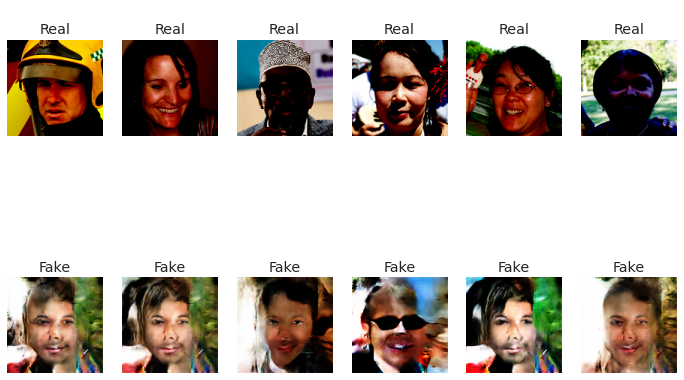

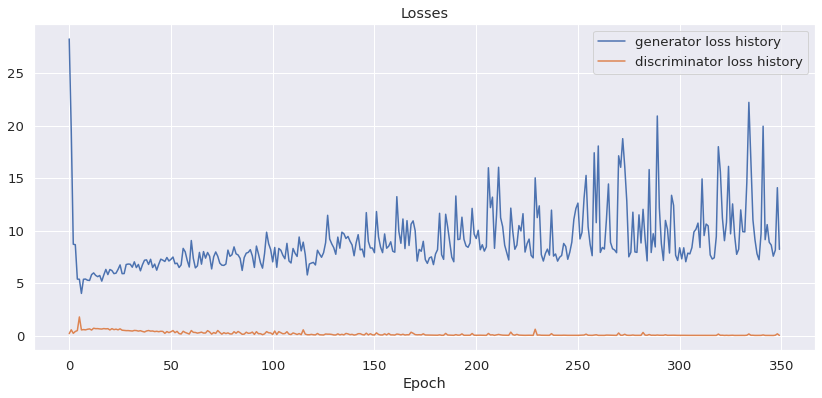

Saving generated-images-0350.png


In [61]:
history = fit(model, criterion)

In [62]:
losses_g, losses_d, real_scores, fake_scores = history

Text(0.5, 1.0, 'Losses')

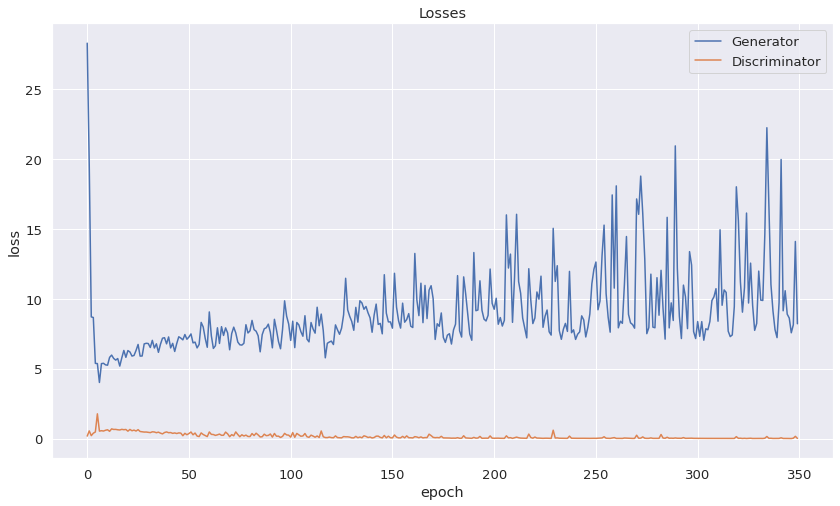

In [63]:
plt.figure(figsize=(14, 8))
plt.plot(losses_g, '-')
plt.plot(losses_d, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Generator', 'Discriminator'])
plt.title('Losses')     

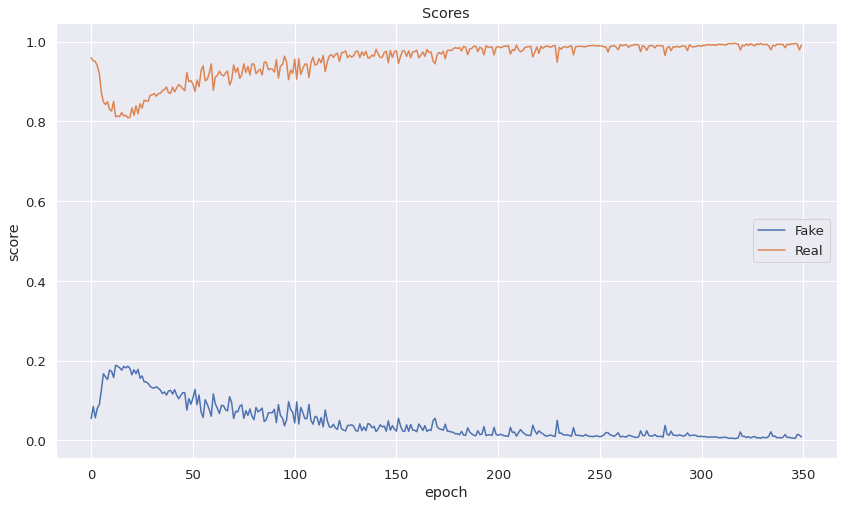

In [64]:
plt.figure(figsize=(14, 8))
plt.plot(fake_scores, '-')
plt.plot(real_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Fake', 'Real'])
plt.title('Scores');     

In [65]:
sample_dir = 'model_weight'  # Создадим папку для сохранения весов моделей
os.makedirs(sample_dir, exist_ok=True) 

In [66]:
# Сохранение весов дискриминатора
torch.save(model["discriminator"].state_dict(), '/content/model_weight' + str('/discriminator.pt'))

# Сохранение весов генератора
torch.save(model["generator"].state_dict(), '/content/model_weight' + str('/generator.pt'))

## Часть 3. Генерация изображений (1 балл)

Теперь давайте оценим качество получившихся изображений. Напишите функцию, которая выводит изображения, сгенерированные нашим генератором

In [67]:
n_images = 40

fixed_latent = torch.randn(n_images, latent_size, 1, 1, device=device)
fake_images = model["generator"](fixed_latent)

In [68]:
def show_generated_images(generated):
  fig, ax = plt.subplots(figsize=(12, 12))
  ax.set_xticks([]); ax.set_yticks([])
  ax.imshow(make_grid(denorm(generated.cpu().detach()), nrow=8).permute(1, 2, 0))
  pass

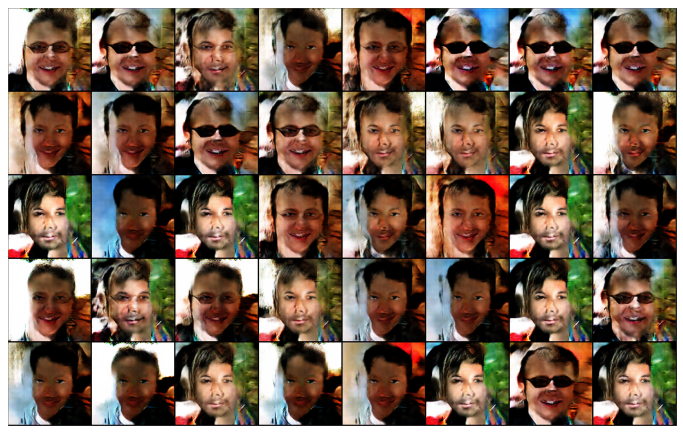

In [69]:
show_generated_images(fake_images) 

Как вам качество получившихся изображений?

### Вывод
Видим, что сгенерированные изображения очень похожи друг на друга, хотя модель неплохо отрисовывает очки (и солнечные и обычные), разны эмоции, пытается отрисовать разный фон. 
Результат неудовлетворительный: за 350 эпох кажется, что результаты хуже, чем за 100 эпох, судя по графикам Lossa.

Есть предположение, что надо было добавить гаусовского шума в генерируемые изображения.

## Часть 4. Leave-one-out-1-NN classifier accuracy (6 баллов)

### 4.1. Подсчет accuracy (4 балла)

Не всегда бывает удобно оценивать качество сгенерированных картинок глазами. В качестве альтернативы вам предлагается реализовать следующий подход:
  * Сгенерировать столько же фейковых изображений, сколько есть настоящих в обучающей выборке. Присвоить фейковым метку класса 0, настоящим – 1.
  * Построить leave-one-out оценку: обучить 1NN Classifier (`sklearn.neighbors.KNeighborsClassifier(n_neighbors=1)`) предсказывать класс на всех объектах, кроме одного, проверить качество (accuracy) на оставшемся объекте. В этом вам поможет `sklearn.model_selection.LeaveOneOut`

In [70]:
# всего настоящих изображений
len(dataset)

4000

In [71]:
image_files = image_files[:2000]
# создадим датасет из торч-тензоров
dataset = DatasetLoader(image_files) 
data_loader = DataLoader(dataset, batch_size=64, shuffle=True, num_workers=2, pin_memory=True)    
len(data_loader)

32

In [72]:
# присвоим настоящим фотографиям метку класса 1
real_targets = torch.ones(len(dataset), 1, device=device)

# присвоим сгенерированным фотографиям метку класса 0    
fake_targets = torch.zeros(len(dataset), 1, device=device)

In [73]:
# создадим тензор из настоящих фотографий
real_images= torch.FloatTensor()
iterator = iter(data_loader)
for i in tqdm(range(len(data_loader))):
    real_images = torch.cat((real_images, next(iterator).cpu()))

  0%|          | 0/32 [00:00<?, ?it/s]

In [74]:
# сгенерируем столько же фейковых изображений, сколько есть настоящих в обучающей выборке

# отключим протекание градиента
model["generator"].eval()
with torch.no_grad():
    fake_images = model["generator"](torch.randn(len(dataset), latent_size, 1, 1, device=device))

In [75]:
all_images= torch.cat((real_images, fake_images.to('cpu')))
all_images.shape

torch.Size([4000, 3, 128, 128])

In [76]:
labels = torch.cat((real_targets.to('cpu'), fake_targets.to('cpu')))
labels = labels.reshape(-1)
labels.shape

torch.Size([4000])

In [77]:
all_images = all_images.reshape(all_images.shape[0],-1).numpy() #создадим плоский вектор
all_images.shape

(4000, 49152)

In [78]:
# объявим 1NN Classifier и LeaveOneOut()
knn = KNeighborsClassifier(n_neighbors=1, n_jobs=-1)
loo = LeaveOneOut()
print(loo.get_n_splits(all_images))

4000


In [79]:
# посмотрим, как работает LeaveOneOut()
for i, (train_index, test_index) in enumerate(loo.split(all_images)):
  print(f"Fold  {i}:")
  #print(f" Train: index={train_index}")
  print(f" Test: index={test_index}")
  if i == 5:
    break

Fold  0:
 Test: index=[0]
Fold  1:
 Test: index=[1]
Fold  2:
 Test: index=[2]
Fold  3:
 Test: index=[3]
Fold  4:
 Test: index=[4]
Fold  5:
 Test: index=[5]


In [80]:
# будем сохранять оценку и значение метки класса по каждому объекту
mean_accuracy = []
m_labels = []

In [81]:
for train_index, test_index in tqdm(loo.split(all_images)):
    X_train, X_test = all_images[train_index], all_images[test_index]
    y_train, y_test = labels[train_index], labels[test_index]
    knn.fit(X_train, y_train)
    y_pred = knn.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    mean_accuracy.append(accuracy)
    m_labels.append(y_test)

0it [00:00, ?it/s]

In [82]:
np.array(mean_accuracy).mean()

0.999

Видим, что результат неудовлетворительный, так как идеальная для нас acuuracy - это 0.5... а у нас наоборот почти 1.

### 4.2. Визуализация распределений (2 балла)

Давайте посмотрим на то, насколько похожи распределения настоящих и фейковых изображений. Для этого воспользуйтесь методом, снижающим размерность (к примеру, TSNE) и изобразите на графике разным цветом точки, соответствующие реальным и сгенерированным изображенияи

In [84]:
%%time
import warnings
warnings.filterwarnings("ignore")

X_embedded = TSNE(n_components=2).fit_transform(all_images)
X_embedded.shape

CPU times: user 1min 20s, sys: 6.31 s, total: 1min 27s
Wall time: 1min 1s


(4000, 2)

In [85]:
# Создание диаграммы разброса
fig = px.scatter(None, x=X_embedded[:,0], y=X_embedded[:,1], 
                 labels={
                     "x": "Dimension 1",
                     "y": "Dimension 2"
                 }, opacity=1, color=labels)

# Изменение цвета фона графика
fig.update_layout(dict(plot_bgcolor = 'white'))

# Обновление линий осей
fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='lightgrey', 
                 zeroline=True, zerolinewidth=1, zerolinecolor='lightgrey', 
                 showline=True, linewidth=1, linecolor='black')

fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='lightgrey', 
                 zeroline=True, zerolinewidth=1, zerolinecolor='lightgrey', 
                 showline=True, linewidth=1, linecolor='black')

# Установка названия рисунка
fig.update_layout(title_text="t-SNE")

# Обновление размера маркера
fig.update_traces(marker=dict(size=3))

fig.show()

Прокомментируйте получившийся результат:

### Вывод

Опять же таки видим, что модель разделяет настоящие и фейковые картинки, а мы бы хотели добиться прямо противоположного результата. 

Попробуем поиграть с шумом в следующем разделе.

# Новый раздел

# Вариант II  с добавлением шума

## Часть 1. Подготовка данных

In [203]:
image_files = sorted(list(DATA_DIR.rglob('*.png')))
print(f'Датасет содержит {len(image_files)} изображения')

Датасет содержит 65534 изображения


Возьмем 10.000 изображений.

In [204]:
image_files_2 = image_files[:10000]

In [205]:
# тк наши фотографии уже 128х128, то менять размер не нужно

class DatasetLoader(Dataset):
    """
    Датасет с картинками, который паралельно подгружает их из папок
    производит скалирование и превращение в торчевые тензоры
    """
    def __init__(self, files):
        super().__init__()
        # список файлов для загрузки
        self.files = sorted(files)
        
        self.len_ = len(self.files)
                           
    def __len__(self):
        return self.len_
      
    def load_sample(self, file):
        image = Image.open(file)
        image.load()
        return image

    def __getitem__(self, index):
        # для преобразования изображений в тензоры PyTorch и нормализации входа
        
        transform = tt.Compose([
                                tt.Lambda(lambda x: np.array(x, dtype="float32") / 255),
                                tt.ToTensor(),
                                tt.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
                                ]) 
        
        
        x = self.load_sample(self.files[index])
        x = transform(x)
        return x  

In [206]:
# создадим датасет из торч-тензоров
dataset_2 = DatasetLoader(image_files_2) 

for i in dataset_2:
  print(i.shape)
  break

torch.Size([3, 128, 128])


In [207]:
data_loader_2 = DataLoader(dataset_2, batch_size=64, shuffle=True, num_workers=2, pin_memory=True)    
len(data_loader_2)

157

In [208]:
for i in data_loader_2:
  print(i.shape)
  break

torch.Size([64, 3, 128, 128])


In [209]:
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl: 
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [210]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
device

device(type='cuda')

In [211]:
data_loader_device_2 = DeviceDataLoader(data_loader_2, device)

In [212]:
for i in data_loader_device_2:
  print(i.shape)
  break

torch.Size([64, 3, 128, 128])


In [213]:
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

In [214]:
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images in dl:
        show_images(images, nmax)
        break

Посмотрим, как выглядит батч

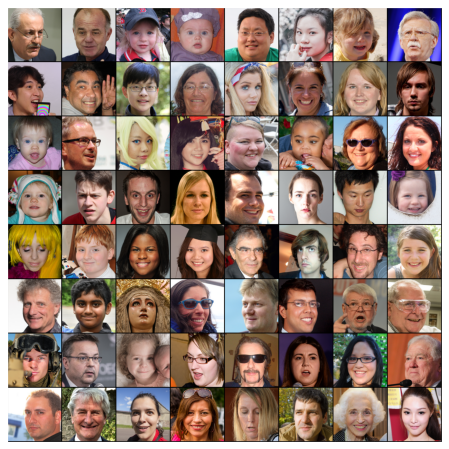

In [215]:
show_batch(data_loader_2)

## Часть 2. Построение и обучение модели

Добавим класс для добавления гауссовского шума в дискриминатор.

In [216]:
class GaussianNoise(nn.Module):
    
    def __init__(self, std=0.25):
        super(GaussianNoise, self).__init__()
        self.std = std
        
    def forward(self, x):
        if self.training:
          gauss = torch.empty_like(x).normal_(0, std=self.std)
          return x + gauss
        else:
          return x  

In [217]:
class Discriminator_2(nn.Module):
  def __init__(self, std = 0.08):
    super(Discriminator_2, self).__init__() 
    self.std = std

    self.main = nn.Sequential(
      
      GaussianNoise(self.std),
      nn.Conv2d(3, 128,  kernel_size=4, stride=2, padding=1, bias=False),
      nn.LeakyReLU(0.2, inplace=True),
            
      GaussianNoise(self.std),      
      nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
      nn.BatchNorm2d(256),
      nn.LeakyReLU(0.2, inplace=True),
      
      GaussianNoise(self.std),
      nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
      nn.BatchNorm2d(512),
      nn.LeakyReLU(0.2, inplace=True),
      
      GaussianNoise(self.std),
      nn.Conv2d(512, 1024, kernel_size=4, stride=2, padding=1, bias=False),
      nn.BatchNorm2d(1024),
      nn.LeakyReLU(0.2, inplace=True),
      
      GaussianNoise(self.std),
      nn.Conv2d(1024, 2056, kernel_size=4, stride=2, padding=1, bias=False),
      nn.BatchNorm2d(2056),
      nn.LeakyReLU(0.2, inplace=True),
            
      GaussianNoise(self.std),      
      nn.Conv2d(2056, 1, kernel_size=4, stride=1, padding=0, bias=False),
      
      nn.Flatten(),
      nn.Sigmoid())

  def forward(self, input):
      return self.main(input)

In [218]:
discriminator_2 = to_device(Discriminator_2(), device)

In [219]:
summary(discriminator_2, (3, 128, 128))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
     GaussianNoise-1          [-1, 3, 128, 128]               0
            Conv2d-2          [-1, 128, 64, 64]           6,144
         LeakyReLU-3          [-1, 128, 64, 64]               0
     GaussianNoise-4          [-1, 128, 64, 64]               0
            Conv2d-5          [-1, 256, 32, 32]         524,288
       BatchNorm2d-6          [-1, 256, 32, 32]             512
         LeakyReLU-7          [-1, 256, 32, 32]               0
     GaussianNoise-8          [-1, 256, 32, 32]               0
            Conv2d-9          [-1, 512, 16, 16]       2,097,152
      BatchNorm2d-10          [-1, 512, 16, 16]           1,024
        LeakyReLU-11          [-1, 512, 16, 16]               0
    GaussianNoise-12          [-1, 512, 16, 16]               0
           Conv2d-13           [-1, 1024, 8, 8]       8,388,608
      BatchNorm2d-14           [-1, 102

In [220]:
latent_size = 128

В генераторе заменим ReLU на LeakyReLU.

In [221]:
class Generator_2(nn.Module):
  def __init__(self):
    super(Generator_2, self).__init__()

    self.main = nn.Sequential(
      # in: latent_size x 1 x 1

      nn.ConvTranspose2d(latent_size, 1024, kernel_size=4, stride=1, padding=0, bias=False),
      nn.BatchNorm2d(1024),
      nn.LeakyReLU(0.2, inplace=True),
      
      nn.ConvTranspose2d(1024, 512, kernel_size=4, stride=2, padding=1, bias=False),
      nn.BatchNorm2d(512),
      nn.LeakyReLU(0.2, inplace=True),
     
      nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
      nn.BatchNorm2d(256),
      nn.LeakyReLU(0.2, inplace=True),
      
      nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
      nn.BatchNorm2d(128),
      nn.LeakyReLU(0.2, inplace=True),
      
      nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
      nn.BatchNorm2d(64),
      nn.LeakyReLU(0.2, inplace=True),
      
      nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
      nn.Tanh()
      )
  def forward(self, input):
    return self.main(input)

In [222]:
generator_2 = to_device(Generator_2(), device)

In [223]:
summary(generator_2, (128, 1, 1) )

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
   ConvTranspose2d-1           [-1, 1024, 4, 4]       2,097,152
       BatchNorm2d-2           [-1, 1024, 4, 4]           2,048
         LeakyReLU-3           [-1, 1024, 4, 4]               0
   ConvTranspose2d-4            [-1, 512, 8, 8]       8,388,608
       BatchNorm2d-5            [-1, 512, 8, 8]           1,024
         LeakyReLU-6            [-1, 512, 8, 8]               0
   ConvTranspose2d-7          [-1, 256, 16, 16]       2,097,152
       BatchNorm2d-8          [-1, 256, 16, 16]             512
         LeakyReLU-9          [-1, 256, 16, 16]               0
  ConvTranspose2d-10          [-1, 128, 32, 32]         524,288
      BatchNorm2d-11          [-1, 128, 32, 32]             256
        LeakyReLU-12          [-1, 128, 32, 32]               0
  ConvTranspose2d-13           [-1, 64, 64, 64]         131,072
      BatchNorm2d-14           [-1, 64,

Посмотрим, как выглядит шум, из которого будут генерироваться изображения

torch.Size([64, 3, 128, 128])


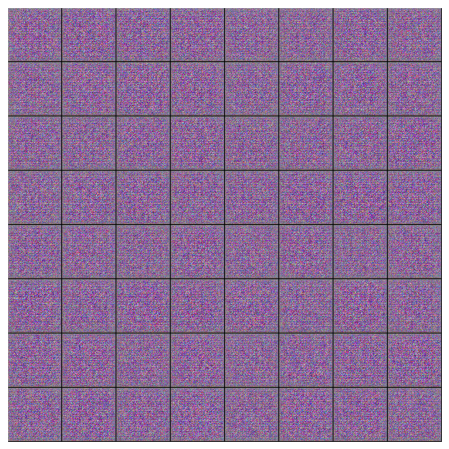

In [224]:
xb = torch.randn(64, latent_size, 1, 1) 
fake_images = generator_2(xb.to(device))
print(fake_images.shape)
show_images(fake_images.cpu())

Перейдем теперь к обучению нашего GANа. Алгоритм обучения следующий:
1. Учим дискриминатор:
  * берем реальные изображения и присваиваем им метку 1
  * генерируем изображения генератором и присваиваем им метку 0
  * обучаем классификатор на два класса

2. Учим генератор:
  * генерируем изображения генератором и присваиваем им метку 0
  * предсказываем дискриминаторором, реальное это изображение или нет


В качестве функции потерь берем бинарную кросс-энтропию

Возьмем 100 эпох раз мы взяли побольше изображений.

In [225]:
lr = 0.0001
epochs = 100
batch_size = 64

model_2 = {
    "discriminator": discriminator_2,
    "generator": generator_2
}

criterion_2 = {
    "discriminator": nn.BCELoss(),
    "generator": nn.BCELoss()
}

In [226]:
sample_dir = 'generated_2'  # Создадим папку для сохранения сгенерированных изображений с использованием шума
os.makedirs(sample_dir, exist_ok=True)

In [227]:
fixed_latent_2 = torch.randn(64, latent_size, 1, 1, device=device)

In [228]:
def save_samples(index, latent_tensors, show=True):
    '''Сохранение изображений, созданных генератором'''
    fake_images = generator_2(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

In [229]:
def fit(model, criterion, epochs=epochs, lr=lr, start_idx=1):
    model["discriminator"].train()
    model["generator"].train()
    torch.cuda.empty_cache()
    
    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []
    
    # Create optimizers
    optimizer = {
        "discriminator": torch.optim.Adam(model["discriminator"].parameters(), 
                                          lr=lr, betas=(0.5, 0.999)),
        "generator": torch.optim.Adam(model["generator"].parameters(),
                                      lr=lr, betas=(0.5, 0.999))
    }

    # Create schedulers
    schedulerD = torch.optim.lr_scheduler.MultiStepLR(optimizer["discriminator"], 
                                                      milestones=[epochs//3,epochs//2,epochs//1.5,epochs//1.2], 
                                                      gamma=0.75)
    schedulerG = torch.optim.lr_scheduler.MultiStepLR(optimizer["generator"],
                                                      milestones=[epochs//3,epochs//2,epochs//1.5,epochs//1.2], 
                                                      gamma=0.75)
    
    for epoch in range(epochs):
        loss_d_per_epoch = []
        loss_g_per_epoch = []
        real_score_per_epoch = []
        fake_score_per_epoch = []
        for real_images in tqdm(data_loader_device_2):

            #print(real_images.size())

            # Train discriminator
            # Clear discriminator gradients
            optimizer["discriminator"].zero_grad()

            # Pass real images through discriminator
            real_preds = model["discriminator"](real_images)
            #print(real_preds.size())
            real_targets = torch.rand(real_images.size(0), 1, device=device)*0.1+0.9
            #print(real_targets.size())
            real_loss = criterion["discriminator"](real_preds, real_targets)
            cur_real_score = torch.mean(real_preds).item()
            
            # Generate fake images
            latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
            fake_images = model["generator"](latent)

            # Pass fake images through discriminator
            fake_targets = torch.rand(fake_images.size(0), 1, device=device)*0.1
            fake_preds = model["discriminator"](fake_images)
            fake_loss = criterion["discriminator"](fake_preds, fake_targets)
            cur_fake_score = torch.mean(fake_preds).item()

            real_score_per_epoch.append(cur_real_score)
            fake_score_per_epoch.append(cur_fake_score)

            # Update discriminator weights
            loss_d = real_loss + fake_loss
            loss_d.backward()
            optimizer["discriminator"].step()
            loss_d_per_epoch.append(loss_d.item())


            # Train generator
            # Clear generator gradients
            optimizer["generator"].zero_grad()
            
            # Generate fake images
            latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
            fake_images = model["generator"](latent)
            
            # Try to fool the discriminator
            preds = model["discriminator"](fake_images)
            targets = torch.ones(batch_size, 1, device=device)
            loss_g = criterion["generator"](preds, targets)
            
            # Update generator weights
            loss_g.backward()
            optimizer["generator"].step()
            loss_g_per_epoch.append(loss_g.item())
            
        # Record losses & scores
        losses_g.append(np.mean(loss_g_per_epoch))
        losses_d.append(np.mean(loss_d_per_epoch))
        real_scores.append(np.mean(real_score_per_epoch))
        fake_scores.append(np.mean(fake_score_per_epoch))

        schedulerD.step()
        schedulerG.step()
        
        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, 
            losses_g[-1], losses_d[-1], real_scores[-1], fake_scores[-1]))
        
        fig, ax = plt.subplots(2, 6, figsize = (12, 8))
        for k in range(6):
            ax[0, k].imshow((real_images[k].detach().cpu().permute(1,2,0)), cmap='gray')
            ax[0, k].set_title("\nReal")
            ax[0, k].axis('off')
            ax[1, k].imshow((denorm(fake_images[k].detach().cpu().permute(1,2,0))), cmap='gray')
            ax[1, k].set_title("Fake")
            ax[1, k].axis('off')    

        fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(14, 6))
        clear_output(True)
        if losses_g is not None:
            ax.plot(losses_g, label='generator loss history')
            ax.set_xlabel('Epoch')
            ax.set_title('Losses with noise')
        if losses_d is not None:
            ax.plot(losses_d, label='discriminator loss history')
        plt.legend()
        plt.show()     
    
        # Save generated images last epochs
        if epoch == epochs - 1:
          save_samples(epoch+start_idx, fixed_latent, show=False)
    
    return losses_g, losses_d, real_scores, fake_scores

Постройте графики лосса для генератора и дискриминатора. Что вы можете сказать про эти графики?

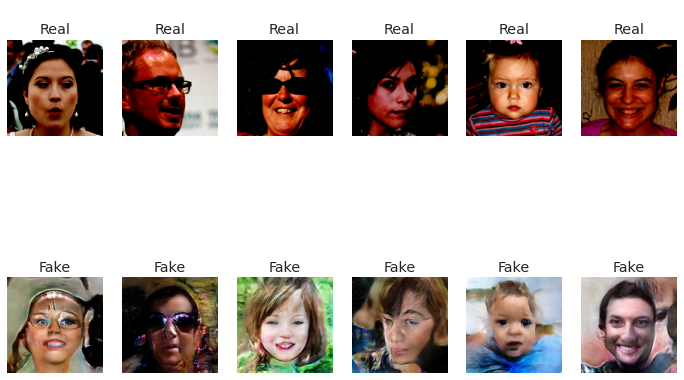

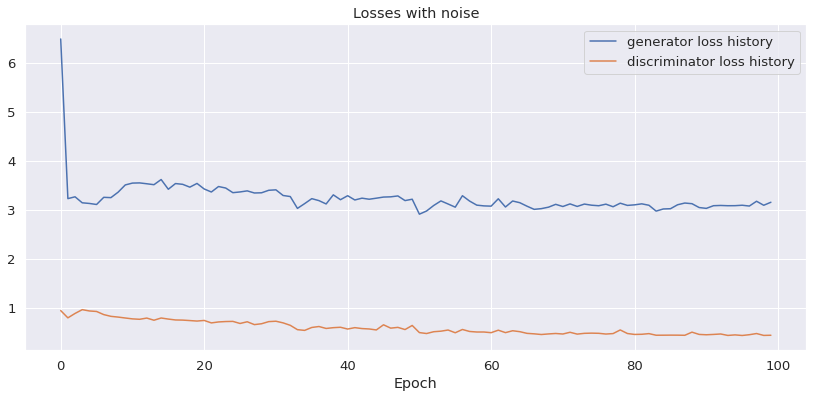

Saving generated-images-0100.png


In [230]:
history_2 = fit(model_2, criterion_2)

In [231]:
losses_g_2, losses_d_2, real_scores_2, fake_scores_2 = history_2

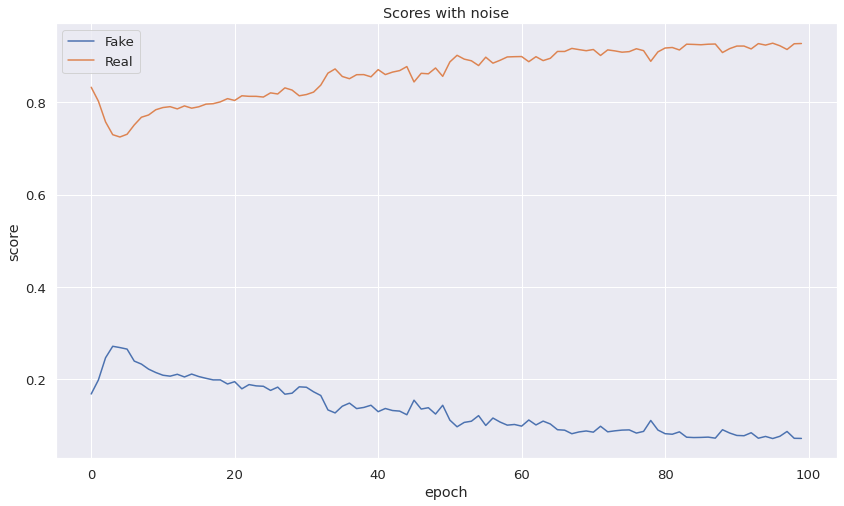

In [233]:
plt.figure(figsize=(14, 8))
plt.plot(fake_scores_2, '-')
plt.plot(real_scores_2, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Fake', 'Real'])
plt.title('Scores with noise');     

In [234]:
sample_dir = 'model_weight_2'  # Создадим папку для сохранения весов моделей
os.makedirs(sample_dir, exist_ok=True) 

In [235]:
# Сохранение весов дискриминатора
torch.save(model_2["discriminator"].state_dict(), '/content/model_weight_2' + str('/discriminator_2.pt'))

# Сохранение весов генератора
torch.save(model_2["generator"].state_dict(), '/content/model_weight_2' + str('/generator_2.pt'))

## Часть 3. Генерация изображений (1 балл)

Теперь давайте оценим качество получившихся изображений. Напишите функцию, которая выводит изображения, сгенерированные нашим генератором

In [236]:
n_images = 40

fixed_latent = torch.randn(n_images, latent_size, 1, 1, device=device)
fake_images = model_2["generator"](fixed_latent)

In [237]:
def show_generated_images(generated):
  fig, ax = plt.subplots(figsize=(12, 12))
  ax.set_xticks([]); ax.set_yticks([])
  ax.imshow(make_grid(denorm(generated.cpu().detach()), nrow=8).permute(1, 2, 0))
  pass

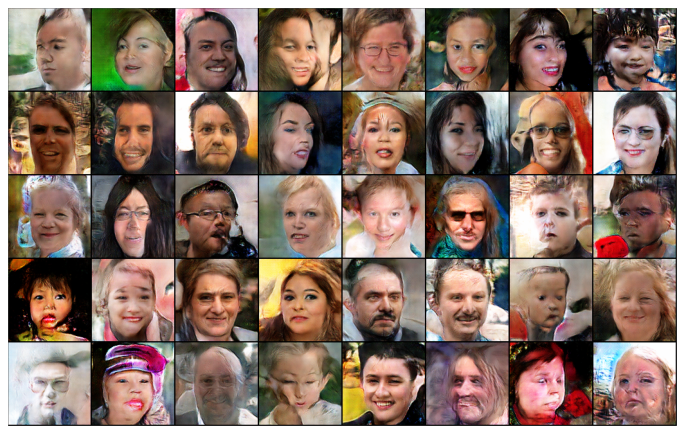

In [238]:
show_generated_images(fake_images) 

Как вам качество получившихся изображений?

### Вывод
Видим, что сгенерированные изображения куда лучше, разнообразней, чем в Варианте I без добавления гауссовского шума. 
Фон также разный.
Кажется, что если взять весь датасет из 65 тысяч фотографий и обучить model_2 на 300 эпохах, то можно получить очень неплохой результат. 

Если обладать достаточным количеством времени и вычислительных ресурсов, конечно. 

## Часть 4. Leave-one-out-1-NN classifier accuracy (6 баллов)

### 4.1. Подсчет accuracy (4 балла)

Не всегда бывает удобно оценивать качество сгенерированных картинок глазами. В качестве альтернативы вам предлагается реализовать следующий подход:
  * Сгенерировать столько же фейковых изображений, сколько есть настоящих в обучающей выборке. Присвоить фейковым метку класса 0, настоящим – 1.
  * Построить leave-one-out оценку: обучить 1NN Classifier (`sklearn.neighbors.KNeighborsClassifier(n_neighbors=1)`) предсказывать класс на всех объектах, кроме одного, проверить качество (accuracy) на оставшемся объекте. В этом вам поможет `sklearn.model_selection.LeaveOneOut`

In [239]:
# всего настоящих изображений
len(dataset_2)

10000

In [240]:
image_files = image_files[:3000]
# создадим датасет из торч-тензоров
dataset_2 = DatasetLoader(image_files) 
data_loader_2 = DataLoader(dataset_2, batch_size=64, shuffle=True, num_workers=2, pin_memory=True)    
len(data_loader_2)

47

In [241]:
# присвоим настоящим фотографиям метку класса 1
real_targets_2 = torch.ones(len(dataset_2), 1, device=device)

# присвоим сгенерированным фотографиям метку класса 0    
fake_targets_2 = torch.zeros(len(dataset_2), 1, device=device)

In [242]:
# создадим тензор из настоящих фотографий
real_images_2= torch.FloatTensor()
iterator = iter(data_loader_2)
for i in tqdm(range(len(data_loader_2))):
    real_images_2 = torch.cat((real_images_2, next(iterator).cpu()))

  0%|          | 0/47 [00:00<?, ?it/s]

In [243]:
# сгенерируем столько же фейковых изображений, сколько есть настоящих в обучающей выборке

# отключим протекание градиента
model_2["generator"].eval()
with torch.no_grad():
    fake_images_2 = model_2["generator"](torch.randn(len(dataset_2), latent_size, 1, 1, device=device))

In [244]:
all_images_2= torch.cat((real_images_2, fake_images_2.to('cpu')))
all_images_2.shape

torch.Size([6000, 3, 128, 128])

In [245]:
labels_2 = torch.cat((real_targets_2.to('cpu'), fake_targets_2.to('cpu')))
labels_2 = labels_2.reshape(-1)
labels_2.shape

torch.Size([6000])

In [246]:
all_images_2 = all_images_2.reshape(all_images_2.shape[0],-1).numpy() #создадим плоский вектор
all_images_2.shape

(6000, 49152)

In [247]:
# объявим 1NN Classifier и LeaveOneOut()
knn = KNeighborsClassifier(n_neighbors=1, n_jobs=-1)
loo = LeaveOneOut()
print(loo.get_n_splits(all_images_2))

6000


In [248]:
# посмотрим, как работает LeaveOneOut()
for i, (train_index, test_index) in enumerate(loo.split(all_images_2)):
  print(f"Fold  {i}:")
  #print(f" Train: index={train_index}")
  print(f" Test: index={test_index}")
  if i == 5:
    break

Fold  0:
 Test: index=[0]
Fold  1:
 Test: index=[1]
Fold  2:
 Test: index=[2]
Fold  3:
 Test: index=[3]
Fold  4:
 Test: index=[4]
Fold  5:
 Test: index=[5]


In [249]:
# будем сохранять оценку и значение метки класса по каждому объекту
mean_accuracy_2 = []
m_labels_2 = []

In [250]:
for train_index, test_index in tqdm(loo.split(all_images_2)):
    X_train, X_test = all_images_2[train_index], all_images_2[test_index]
    y_train, y_test = labels_2[train_index], labels_2[test_index]
    knn.fit(X_train, y_train)
    y_pred = knn.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    mean_accuracy_2.append(accuracy)
    m_labels_2.append(y_test)

0it [00:00, ?it/s]

In [251]:
np.array(mean_accuracy_2).mean()

0.6206666666666667

О, среднее accuracy равное 0.62 это гораздо лучше, чем было!

### 4.2. Визуализация распределений (2 балла)

Давайте посмотрим на то, насколько похожи распределения настоящих и фейковых изображений. Для этого воспользуйтесь методом, снижающим размерность (к примеру, TSNE) и изобразите на графике разным цветом точки, соответствующие реальным и сгенерированным изображенияи

In [252]:
%%time
import warnings
warnings.filterwarnings("ignore")

X_embedded_2 = TSNE(n_components=2).fit_transform(all_images_2)
X_embedded_2.shape

CPU times: user 2min 51s, sys: 6.84 s, total: 2min 58s
Wall time: 2min 5s


(6000, 2)

In [253]:
# Создание диаграммы разброса
fig = px.scatter(None, x=X_embedded_2[:,0], y=X_embedded_2[:,1], 
                 labels={
                     "x": "Dimension 1",
                     "y": "Dimension 2"
                 }, opacity=1, color=labels_2)

# Изменение цвета фона графика
fig.update_layout(dict(plot_bgcolor = 'white'))

# Обновление линий осей
fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='lightgrey', 
                 zeroline=True, zerolinewidth=1, zerolinecolor='lightgrey', 
                 showline=True, linewidth=1, linecolor='black')

fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='lightgrey', 
                 zeroline=True, zerolinewidth=1, zerolinecolor='lightgrey', 
                 showline=True, linewidth=1, linecolor='black')

# Установка названия рисунка
fig.update_layout(title_text="t-SNE")

# Обновление размера маркера
fig.update_traces(marker=dict(size=3))

fig.show()

Прокомментируйте получившийся результат:

## Вывод

Добавление шума в дискриминатор значительно улучшило качество генерируемых фотографий. Теперь дискриминатору не так просто отличить фейк от реального изображения. 

Среднее значение accuracy по 6000 фотографий (3000 реальных и 3000 сгенерированных) методом Leave-one-out равно 0.62, что очень неплохо (стремимся к 0.5, то есть к неразличимости). 

По графику распределения точек видим, что разделить реальные и сгенерированные изображения на классы не представляется возможным. Чего мы и пытались добиться. 